In [1]:
import os, pdb
from PIL import Image
import numpy as np
import torch

from tools import common

from tools.dataloader import norm_RGB
from nets.patchnet import *

import cv2
import matplotlib.pyplot as plt

In [2]:

def load_network(model_fn): 
    checkpoint = torch.load(model_fn)
    print("\n>> Creating net = " + checkpoint['net']) 
    net = eval(checkpoint['net'])
    nb_of_weights = common.model_size(net)
    print(f" ( Model size: {nb_of_weights/1000:.0f}K parameters )")

    # initialization
    weights = checkpoint['state_dict']
    net.load_state_dict({k.replace('module.',''):v for k,v in weights.items()})
    return net.eval()


In [3]:
class NonMaxSuppression (torch.nn.Module):
    def __init__(self, rel_thr=0.7, rep_thr=0.7):
        nn.Module.__init__(self)
        self.max_filter = torch.nn.MaxPool2d(kernel_size=3, stride=1, padding=1)
        self.rel_thr = rel_thr
        self.rep_thr = rep_thr
    
    def forward(self, reliability, repeatability, **kw):
        assert len(reliability) == len(repeatability) == 1
        reliability, repeatability = reliability[0], repeatability[0]

        # local maxima
        maxima = (repeatability == self.max_filter(repeatability))

        # remove low peaks
        maxima *= (repeatability >= self.rep_thr)
        maxima *= (reliability   >= self.rel_thr)

        return maxima.nonzero().t()[2:4]


def extract_multiscale( net, img, detector, scale_f=2**0.25, 
                        min_scale=0.0, max_scale=1, 
                        min_size=256, max_size=1024, 
                        verbose=False):
    old_bm = torch.backends.cudnn.benchmark 
    torch.backends.cudnn.benchmark = False # speedup
    
    # extract keypoints at multiple scales
    B, three, H, W = img.shape
    assert B == 1 and three == 3, "should be a batch with a single RGB image"
    
    assert max_scale <= 1
    s = 1.0 # current scale factor
    
    catched = False
    X,Y,S,C,Q,D = [],[],[],[],[],[]
    while  s+0.001 >= max(min_scale, min_size / max(H,W)):
        if s-0.001 <= min(max_scale, max_size / max(H,W)):
            nh, nw = img.shape[2:]
            if verbose: print(f"extracting at scale x{s:.02f} = {nw:4d}x{nh:3d}")
            # extract descriptors
            with torch.no_grad():
                res = net(imgs=[img])
                
            # get output and reliability map
            descriptors = res['descriptors'][0]
            reliability = res['reliability'][0]
            repeatability = res['repeatability'][0]
            if not catched :
                    ret_reliability = reliability.cpu().detach().numpy().squeeze()
                    ret_repeatability = repeatability.cpu().detach().numpy().squeeze()
                    catched = True
                

            # normalize the reliability for nms
            # extract maxima and descs
            y,x = detector(**res) # nms
            c = reliability[0,0,y,x]
            q = repeatability[0,0,y,x]
            d = descriptors[0,:,y,x].t()
            n = d.shape[0]

            # accumulate multiple scales
            X.append(x.float() * W/nw)
            Y.append(y.float() * H/nh)
            S.append((32/s) * torch.ones(n, dtype=torch.float32, device=d.device))
            C.append(c)
            Q.append(q)
            D.append(d)
        s /= scale_f

        # down-scale the image for next iteration
        nh, nw = round(H*s), round(W*s)
        img = F.interpolate(img, (nh,nw), mode='bilinear', align_corners=False)

    # restore value
    torch.backends.cudnn.benchmark = old_bm
    
    Y = torch.cat(Y)
    X = torch.cat(X)
    S = torch.cat(S) # scale
    scores = torch.cat(C) * torch.cat(Q) # scores = reliability * repeatability
    XYS = torch.stack([X,Y,S], dim=-1)
    D = torch.cat(D)
    return XYS, D, scores, ret_reliability, ret_repeatability

In [281]:
reliability_thr = .7
repeatability_thr = .7

network_path = "./models/faster2d2_WASF_N16.pt"
img_path = "../../Data/22.png"
# img_path = "./imgs/brooklyn.png"

In [282]:
net = load_network(network_path)


>> Creating net = Fast_Quad_L2Net_ConfCFS()
 ( Model size: 486K parameters )


In [283]:
detector = NonMaxSuppression(
    rel_thr = reliability_thr, 
    rep_thr = repeatability_thr)


In [284]:
img = Image.open(img_path).convert('RGB')
img_rgb = img

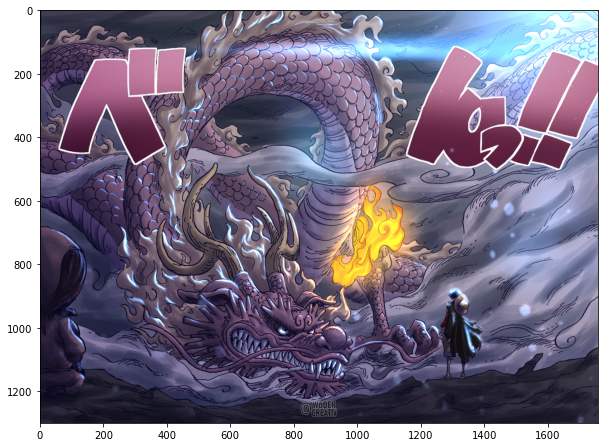

In [285]:
plt.figure(figsize=(10, 10))
plt.imshow(img_rgb)

In [286]:
W, H = img.size
img = norm_RGB(img)[None] 

In [287]:
xys, desc, scores, reliability, repeatability  = extract_multiscale(net, img, detector, min_size=256, max_size=1600, verbose=True)

extracting at scale x0.84 = 1478x1093
extracting at scale x0.71 = 1243x919
extracting at scale x0.59 = 1045x773
extracting at scale x0.50 =  879x650
extracting at scale x0.42 =  739x547
extracting at scale x0.35 =  622x460
extracting at scale x0.30 =  523x386
extracting at scale x0.25 =  440x325
extracting at scale x0.21 =  370x273
extracting at scale x0.18 =  311x230
extracting at scale x0.15 =  261x193


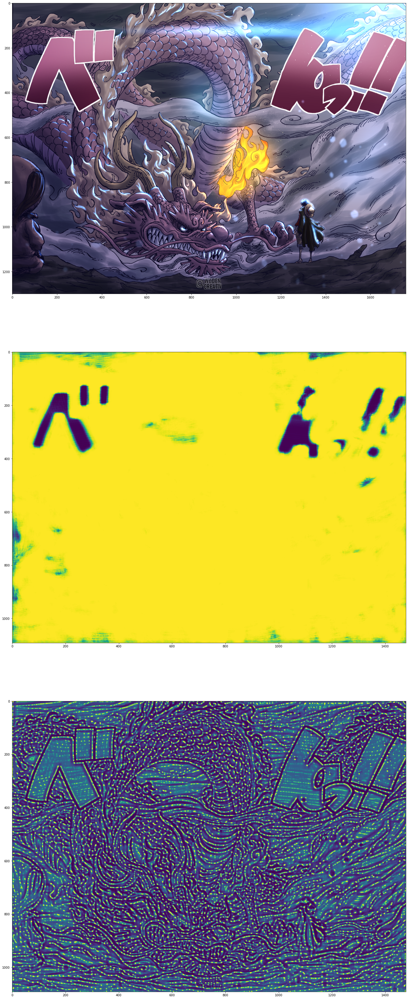

In [288]:
fig, ax = plt.subplots(3, 1, figsize=(30,60))
pos = ax[0].imshow(img_rgb)
pos = ax[1].imshow(reliability)
# plt.colorbar(mappable=pos, ax=ax[1])
pos = ax[2].imshow(repeatability)
# plt.colorbar(mappable=pos, ax=ax[2])


In [289]:
kps = xys.cpu().detach().numpy().astype('int')
reliability_thr= .995
reliable_kps = [kp for kp, score in zip(kps,scores) if score>reliability_thr ]

In [290]:
len(reliable_kps)

3673

In [291]:
rkps = np.array(reliable_kps)

In [292]:
rkps.shape

(3673, 3)

In [293]:
rkps[:,1].shape

(3673,)

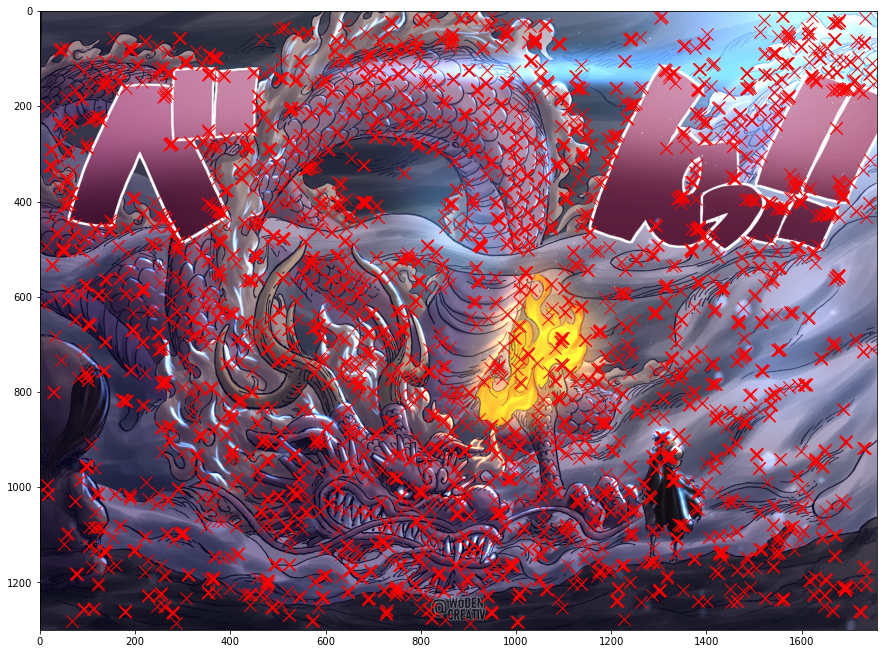

In [294]:
plt.figure(figsize=(15,15))
plt.imshow(img_rgb)
plt.scatter(x=rkps[:,0],y=rkps[:,1], marker='x', linewidths=1, c='r', s=150)

In [331]:
# img1_path = "../../Data/input_0.png"
# img2_path = "../../Data/input_1.png"
# img1_path = "../../Data/box.png"
# img2_path = "../../Data/box_in_scene.png"
# img1_path = "../../Data/h1.jpg"
# img2_path = "../../Data/h2.jpg"
# img1_path = "../../Data/w1.jpg"
# img2_path = "../../Data/w2.jpg"
# img1_path = "../../Data/reeses_puffs.png"
# img2_path = "../../Data/many_cereals.jpg"
img1_path = "../../Data/b1.jpg"
img2_path = "../../Data/b2.jpg"
# img1_path = "../../Data/a1.jpg"
# img2_path = "../../Data/a2.jpg"

In [332]:
# img1 = Image.open("../../Data/reeses_puffs.png").convert('RGB')
# img2 = Image.open("../../Data/many_cereals.jpg").convert("RGB")
img1 = Image.open(img1_path).convert('RGB')
img2 = Image.open(img2_path).convert("RGB")
img1_rgb = np.array(img1)
img2_rgb = np.array(img2)
img1_gray = cv2.imread(img1_path, 0)
img2_gray = cv2.imread(img2_path, 0)

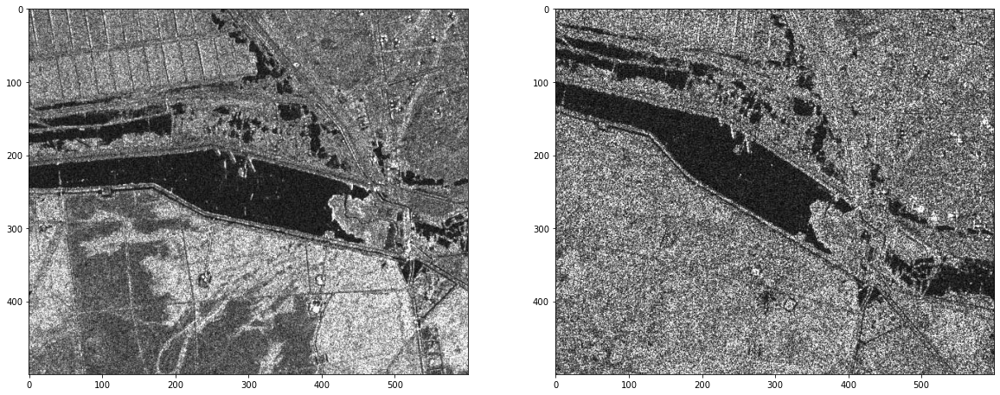

In [333]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
ax[0].imshow(img1_rgb)
ax[1].imshow(img2_rgb)

In [334]:
img1 = norm_RGB(img1)[None] 
xys_img1, desc_img1, scores_img1, reliability_img1, repeatability_img1  = extract_multiscale(net, img1, detector, min_size=64, verbose=True)

extracting at scale x1.00 =  600x500
extracting at scale x0.84 =  505x420
extracting at scale x0.71 =  424x354
extracting at scale x0.59 =  357x297
extracting at scale x0.50 =  300x250
extracting at scale x0.42 =  252x210
extracting at scale x0.35 =  212x177
extracting at scale x0.30 =  178x149
extracting at scale x0.25 =  150x125
extracting at scale x0.21 =  126x105
extracting at scale x0.18 =  106x 88
extracting at scale x0.15 =   89x 74
extracting at scale x0.13 =   75x 63


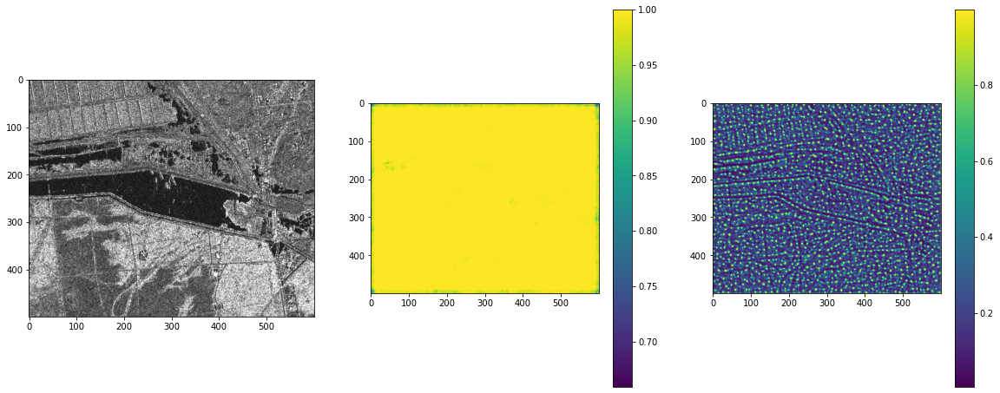

In [335]:
fig, ax = plt.subplots(1, 3, figsize=(20,8))
pos = ax[0].imshow(img1_rgb)
pos = ax[1].imshow(reliability_img1)
plt.colorbar(pos, ax=ax[1])
pos = ax[2].imshow(repeatability_img1)
plt.colorbar(pos, ax=ax[2])


In [336]:
img2 = norm_RGB(img2_rgb)[None] 
xys_img2, desc_img2, scores_img2, reliability_img2, repeatability_img2  = extract_multiscale(net, img2, detector, min_size=64, verbose=True)

extracting at scale x1.00 =  600x500
extracting at scale x0.84 =  505x420
extracting at scale x0.71 =  424x354
extracting at scale x0.59 =  357x297
extracting at scale x0.50 =  300x250
extracting at scale x0.42 =  252x210
extracting at scale x0.35 =  212x177
extracting at scale x0.30 =  178x149
extracting at scale x0.25 =  150x125
extracting at scale x0.21 =  126x105
extracting at scale x0.18 =  106x 88
extracting at scale x0.15 =   89x 74
extracting at scale x0.13 =   75x 63


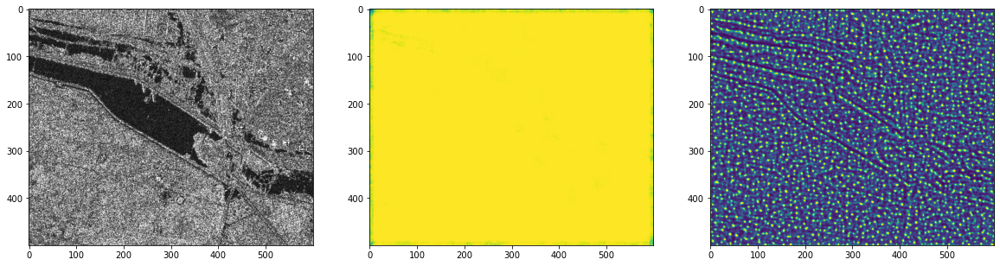

In [337]:
fig, ax = plt.subplots(1, 3, figsize=(20,8))
pos = ax[0].imshow(img2_rgb)
pos = ax[1].imshow(reliability_img2)
pos = ax[2].imshow(repeatability_img2)


In [352]:
reliability_thr= .9

In [353]:
kps1 = xys_img1.cpu().detach().numpy()
scores1 = scores_img1.cpu().detach().numpy()
descs1 = desc_img1.cpu().detach().numpy()
kp1 = np.array([kp for kp, score, desc in zip(kps1, scores1, descs1) if score>reliability_thr])
desc1 = np.array([desc for kp, score, desc in zip(kps1, scores1, descs1) if score>reliability_thr ])

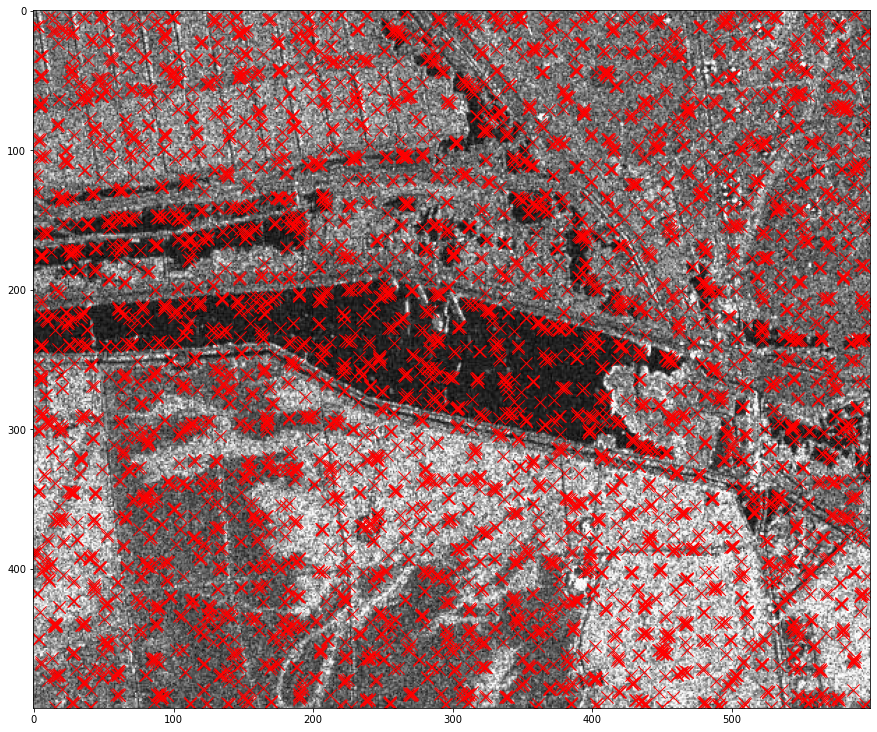

In [354]:
plt.figure(figsize=(15,15))
plt.imshow(img1_rgb)
plt.scatter(x=kp1[:,0],y=kp1[:,1], marker='x', linewidths=1, c='r', s=150)

In [355]:
kps2 = xys_img2.cpu().detach().numpy()
scores2 = scores_img2.cpu().detach().numpy()
descs2 = desc_img2.cpu().detach().numpy()
kp2 = np.array([kp for kp, score, desc in zip(kps2, scores2, descs2) if score>reliability_thr])
desc2 = np.array([desc for kp, score, desc in zip(kps2, scores2, descs2) if score>reliability_thr ])

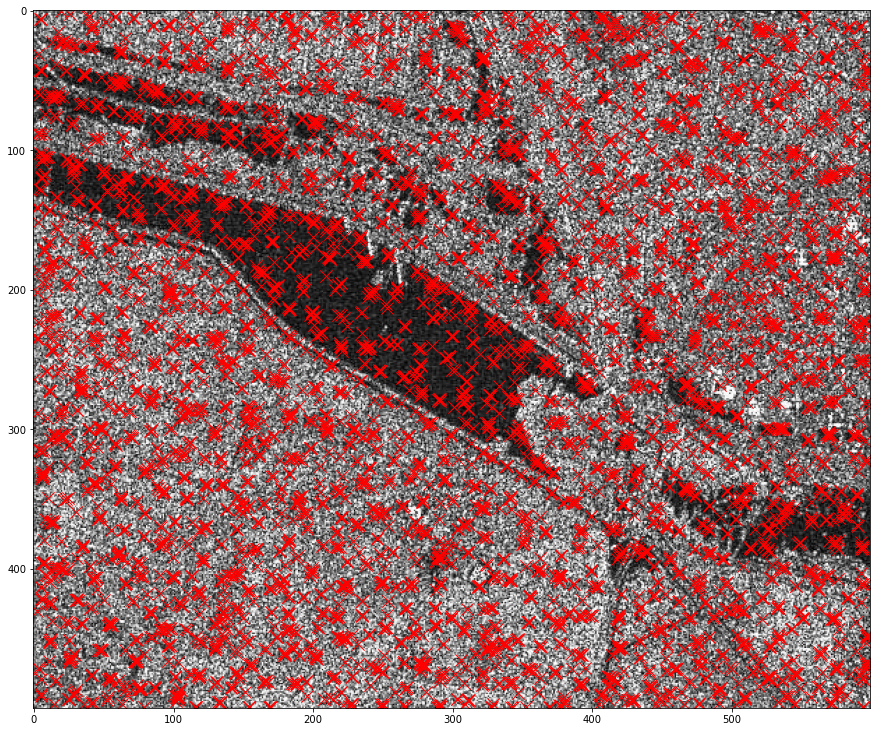

In [356]:
plt.figure(figsize=(15,15))
plt.imshow(img2_rgb)
plt.scatter(x=kp2[:,0],y=kp2[:,1], marker='x', linewidths=1, c='r', s=150)

In [357]:
def to_opencv_keypoints(keypoints,size_scale=20):
    converterd_keypoints=[]
    for x, y, scale in keypoints:
        k=cv2.KeyPoint(x=x, y=y, size=scale, angle=0, octave=int(scale))
        converterd_keypoints.append(k)
    return converterd_keypoints

In [358]:
keys1 = to_opencv_keypoints(kp1)
keys2 = to_opencv_keypoints(kp2)

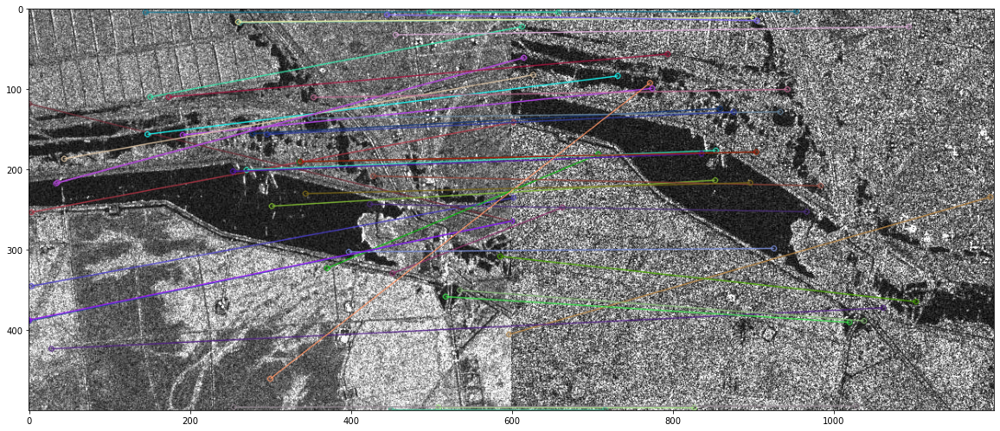

In [359]:
# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(desc1,desc2, k=2)

# Apply ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.9*n.distance:
        good_matches.append([m])

# cv2.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(img1_rgb,keys1,img2_rgb,keys2,good_matches,outImg=None,flags=2)
plt.figure(figsize=(20,18))
plt.imshow(img3)

In [360]:
pt1=[kp1[m[0].queryIdx][:2] for m in good_matches ]
pt2=[kp2[m[0].trainIdx][:2] for m in good_matches ]
pt1=np.array(pt1)
pt2=np.array(pt2)

In [370]:
h,mask=cv2.findHomography(srcPoints=pt1,dstPoints=pt2,method=cv2.FM_RANSAC, ransacReprojThreshold=5)
# h,mask=cv2.findHomography(srcPoints=pt1,dstPoints=pt2,method=cv2.RANSAC, ransacReprojThreshold=5)

sum(mask==1)

array([15])

In [371]:
def translatePoint(p, d):
    x, y = p
    dx, dy = d
    return [x + dx, y + dy]


In [372]:
def homographyTransform(h,p):
    res=h@p
    res=res/res[-1]
    return res[:2].astype('int')

In [373]:


def drawMatches(pt1, img1, pt2, img2, mask, h_mat):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    img = np.zeros(shape=(max(h1, h2), w1 + w2), dtype='uint8')
    img[:h1, :w1] = img1
    img[:h2, w1:] = img2
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    x = []
    x.append([0, 0, 1])
    x.append([w1, 0, 1])
    x.append([w1, h1, 1])
    x.append([0, h1, 1])

    tx = [translatePoint(homographyTransform(h_mat, np.array(p)), (w1, 0)) for p in x]
    tx = np.array([tx])
    for i, m in enumerate(mask):
        if m == 1:
            dst = (int(w1 + pt2[i][0]), int(pt2[i][1]))
            src = (int(pt1[i][0]), int(pt1[i][1]))
            #             color=tuple(np.random.randint(0,255,3,dtype='int'))
            color = np.random.randint(0, 255, size=(3), dtype=np.uint8)
            color = (int(color[0]), int(color[1]), int(color[2]))
            cv2.line(img, src, dst, color, thickness=1)
    cv2.polylines(img, tx, isClosed=True, color=color, thickness=2)
    plt.figure(figsize=(20, 18))
    plt.imshow(img)
    plt.show()
    return img


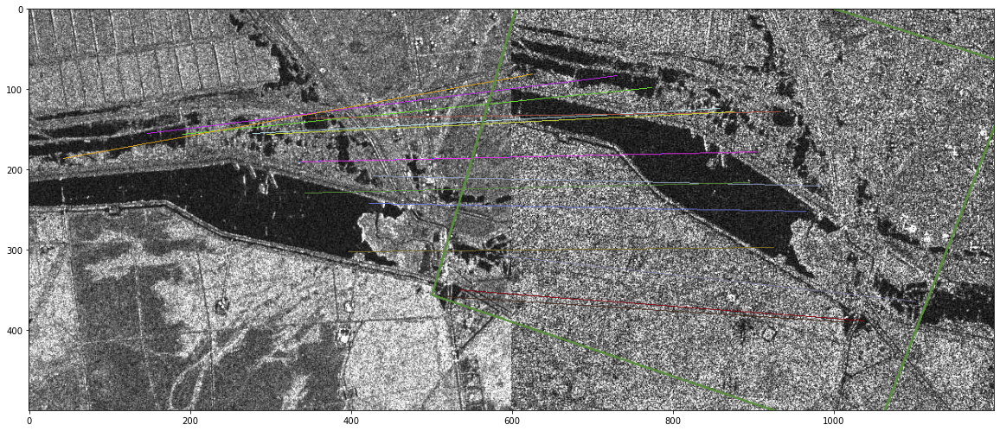

In [374]:
imgg=drawMatches(pt1,img1_gray,pt2,img2_gray,mask,h)

In [375]:
img=cv2.warpPerspective(img1_gray,h,img2_gray.shape[::-1])

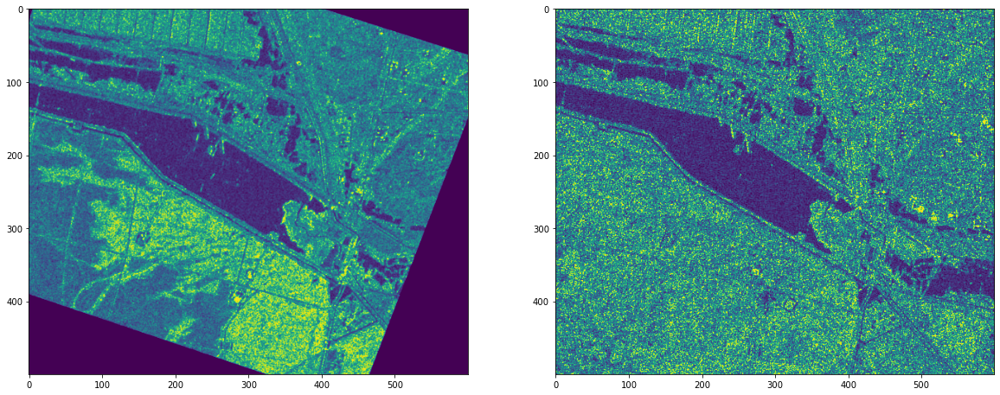

In [376]:
fig,ax=plt.subplots(1,2,figsize=(20,18))
ax[0].imshow(img)
ax[1].imshow(img2_gray)

In [377]:
def homographyAddTranslation(h, translation):
    h_t = np.eye(3)
    h_t[0, 2] = translation[1]
    h_t[1, 2] = translation[0]
    return h_t @ h

def crop_image(img,percentile=.6):
    height,width=img.shape[:2]
    h=int(percentile*height/2)
    w=int(percentile*width/2)
    return img[h:-h,w:-w]

def grid_img(img,grid_size=60):
    data=img.copy()
    h,w=img.shape[:2]
    n_h=h//grid_size
    n_w=w//grid_size
    skip=-1
    for m in range(n_h-1):
        for n in range(n_w-1):
            skip*=-1
            if skip==1:
                data[m*grid_size:(m+1)*grid_size,n*grid_size:(n+1)*grid_size]=0
    return data
def stichImages(img1, img2, h):
    dst_h, dst_w = img2.shape[:2]
    dst_shape = (dst_w * 3, dst_h * 3)
    h = homographyAddTranslation(h, (dst_h, dst_w))
    img = cv2.warpPerspective(img1, h, dst_shape)
#     fig, ax = plt.subplots(1, 2, figsize=(20, 18))
    padded_img = np.pad(img2, [[dst_h, dst_h], [dst_w, dst_w]])
#     ax[0].imshow(img)
#     ax[1].imshow(padded_img)
#     plt.show()
    img_registeded = padded_img.copy()
    img=grid_img(img)
    img_registeded[img != 0] = img[img != 0]
    img_registeded=crop_image(img_registeded)
    plt.figure(figsize=(14, 10))
    plt.imshow(img_registeded)
    plt.show()
    return 

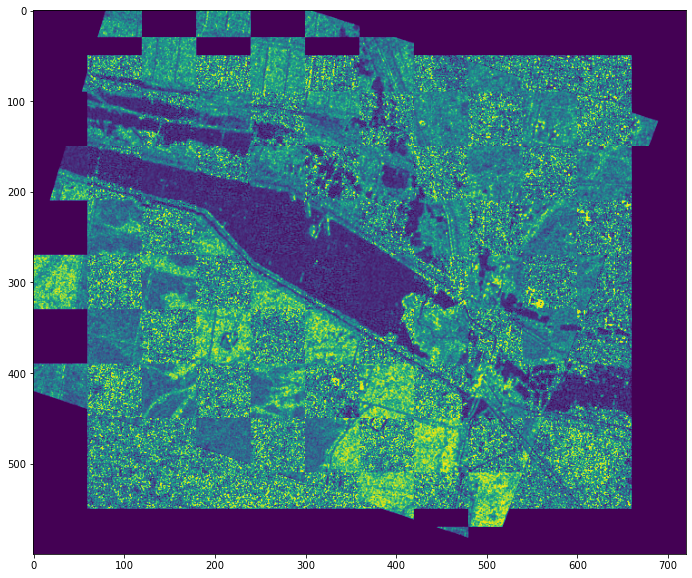

In [378]:
img_registeded = stichImages(img1_gray, img2_gray, h)